# MACHINE LEARNING PROJECT

## Importing Libraries

In [1]:
#What to install: 
#!pip install descartes

In [2]:
import pandas as pd
import numpy as np
from datetime import datetime
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import geobr
import geopandas as gpd
from shapely.geometry import Point
from geopandas import GeoDataFrame
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.cluster import DBSCAN
from sklearn import metrics
import warnings

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

## Importing the file 

In [3]:
df = pd.read_csv("customer_segmentation.csv")

Then we set the option to visualize all the columns when displaying the dataframe.

In [4]:
pd.set_option("display.max_columns", None)

Visualizing the first 5 rows of the dataset

In [5]:
df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_type,payment_installments,payment_value,customer_unique_id,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_city,seller_state,product_category_name,product_name_lenght,product_description_lenght,product_category_name_english
0,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,boleto,1,141.46,af07308b275d755c9edb36a90c618231,barreiras,BA,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.7,22.76,belo horizonte,SP,perfumaria,29,178,perfumery
1,86674ccaee19790309333210917b2c7d,1b338293f35549b5e480b9a3d7bbf3cd,delivered,2018-08-09 11:37:35,2018-08-09 14:35:19,2018-08-10 14:34:00,2018-08-14 18:51:47,2018-08-22 00:00:00,credit_card,5,135.82,8b8028d453a01986b48c4271cc341475,ituverava,SP,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-08-13 14:31:29,116.9,18.92,belo horizonte,SP,perfumaria,29,178,perfumery
2,aee682982e18eb4714ce9f97b15af5e2,8858442ea4d5dc5bb9e118e8f728095d,delivered,2018-07-09 18:46:28,2018-07-11 03:45:45,2018-07-11 15:01:00,2018-07-12 18:14:35,2018-07-18 00:00:00,boleto,1,128.04,3edcab192482e9871c17b34cf98c3996,ribeirao das neves,MG,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-13 03:45:45,118.7,9.34,belo horizonte,SP,perfumaria,29,178,perfumery
3,d543201a9b42a1402ff97e65b439a48b,971bf8f42a9f8cb3ead257854905b454,delivered,2018-08-21 10:00:25,2018-08-21 10:50:54,2018-08-22 15:21:00,2018-08-28 18:58:22,2018-09-10 00:00:00,credit_card,2,279.30,958ac7760e5484df1496ba5833ab6117,gaspar,SC,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-08-23 10:50:54,116.9,22.75,belo horizonte,SP,perfumaria,29,178,perfumery
4,d543201a9b42a1402ff97e65b439a48b,971bf8f42a9f8cb3ead257854905b454,delivered,2018-08-21 10:00:25,2018-08-21 10:50:54,2018-08-22 15:21:00,2018-08-28 18:58:22,2018-09-10 00:00:00,credit_card,2,279.30,958ac7760e5484df1496ba5833ab6117,gaspar,SC,2,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-08-23 10:50:54,116.9,22.75,belo horizonte,SP,perfumaria,29,178,perfumery


## Data Preparation & Cleaning 

Visualizing the data type of each column and checking if they are in the right format.

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13801 entries, 0 to 13800
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_id                       13801 non-null  object 
 1   customer_id                    13801 non-null  object 
 2   order_status                   13801 non-null  object 
 3   order_purchase_timestamp       13801 non-null  object 
 4   order_approved_at              13801 non-null  object 
 5   order_delivered_carrier_date   13801 non-null  object 
 6   order_delivered_customer_date  13801 non-null  object 
 7   order_estimated_delivery_date  13801 non-null  object 
 8   payment_type                   13801 non-null  object 
 9   payment_installments           13801 non-null  int64  
 10  payment_value                  13801 non-null  float64
 11  customer_unique_id             13801 non-null  object 
 12  customer_city                  13801 non-null 

Changing the date columns from object to datetime 

In [7]:
dates = df.columns[3:8].tolist() 
dates.append(df.columns[17])
for x in dates:
    df[x] = pd.to_datetime(df[x], format='%Y-%m-%d %H:%M:%S')

Checking if there are some missing values

In [8]:
if df.isna().sum().sum() == 0:
    print("There are no NaN values")
else:
    print(df.isnan().sum())

There are no NaN values


Checking if there are duplicates

In [9]:
print(f"There are {df.duplicated().sum()} duplicates")

There are 83 duplicates


Removing the duplicates

In [10]:
df= df.drop_duplicates()

Remove the 86 rows that have as order status "canceled" because they have an anomaly pattern since they display the arrival date at destination even though they were canceled orders. 

In [11]:
df=df[df['order_status']!='canceled']

Now we investigate what the dataframe represents, more specifically we investigate the meaning of each row. 

Since our goal is to cluster the customers and then formulate a marketing startegy for each different clusters, we want to understand how many times the same customer_unique_id (the identifier of each customer) is repeated.

In [12]:
df["customer_unique_id"].value_counts()

7582a5a77fc2976628f46a13ec91b375    13
4d99682572b7b5932340a0bce676c18c    12
37bc3d463e2a0024012a7fa587597a3c    12
a5c6335399140e986db84120c425adf0    11
910f0afb84bc778e856d3683c7e8a46a    10
                                    ..
1811fa86febfd40fa2b58186732468f4     1
839ec7c231c579ed10ddab6610f8f12b     1
89b59fe90c14d3e0cf8974983b933eff     1
e75ea98bb2cbafbf1d99019e43612439     1
78275e95a4296105923051e0ad4577b3     1
Name: customer_unique_id, Length: 11186, dtype: int64

By filtering for a specific customer_unique_id, we realized that the purchase displayed can be part of unique order. All the values related to the columns specific for the order per se are the same, what is different are the values relative to the order_item_id and columns that provides information about each single item if the items are different. Therefore the rows of this dataframe do not represent orders but they represent items of a cart. An order is the combination of multiple rows. 

In [13]:
df[df["customer_unique_id"]=="7582a5a77fc2976628f46a13ec91b375"]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,payment_type,payment_installments,payment_value,customer_unique_id,customer_city,customer_state,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,seller_city,seller_state,product_category_name,product_name_lenght,product_description_lenght,product_category_name_english
3512,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,1,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3513,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,2,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3514,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,3,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3515,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,4,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3516,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,5,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3517,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,6,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3518,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,7,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3519,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,8,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3520,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,boleto,1,485.94,7582a5a77fc2976628f46a13ec91b375,sao paulo,SP,9,d34c07a2d817ac73f4caf8c574215fed,e7d5b006eb624f13074497221eb37807,2018-04-19 02:30:52,29.99,7.39,santo andre,SP,telefonia,56,56,telephony
3521,37ee401157a3a0b28c9c6d0ed8c3b24b,7d321bd4e8ba1caf74c4c1aabd9ae524,delivered,2018-04-12 11:02:51,2018-04-14 02:31:43,2018-04-20 20:51:23,2018-04-23 17:47:44,2018-04-26,

## Compressing the dataset

Since we have to cluster the customers, we need first to compress the df_reduced so as the rows do not anymore represent items of a cart but they represent unique orders. For this reason we need to sum the price of each item of the same order, while for the other information no processing is being made since their values are the same for each item of the same cart.

We grouped the dataset by order id so that we end up with a dataframe where each row is a unique order. The price and the freight value are summed to get the total price and total freight value of the order. 

In [14]:
# Group by order_id and apply the aggregation functions

agg_functions = {
    "order_status": "first",
    "order_approved_at": "first",
    "order_purchase_timestamp":"first",
    "payment_type": "first",
    "payment_installments": "first",
    "payment_value": "first",
    "customer_unique_id": "first", 
    "customer_city": "first",
    "customer_state": "first", 
    "seller_id":"first",
    "seller_city":"first", 
    "seller_state":"first",
    'price': 'sum',
    "freight_value":"sum",
    }

df_orders = df.groupby('order_id').agg(agg_functions).reset_index()

We can notice below that specific customers have ordered maximum three times

In [15]:
df_orders["customer_unique_id"].value_counts()

a029899dd8534557a81c369475ff80c8    3
9c08d6f85c7fcec4b08ead25590c0af7    3
64df076fb557552498049bb07ed1cd5f    3
cfa69922f9968e0e6271647abda09b09    3
d4a5e9f19897de65433c9d97bf4b9f8e    3
                                   ..
aea5f1928eb4d8d8b016f6f101566984    1
d340df45a3f9a5f72adc67289c1ca8fe    1
4281cad3192208b2d0100eb08c8f6fce    1
49f8f2dffe67c9b429827fdb48bdffc4    1
adee1f41a8a1659b461473d88cb6975e    1
Name: customer_unique_id, Length: 11186, dtype: int64

## Exploratory Data Analysis

### Numerical variables

We first analyze the correlation among the numerical variables. We can notice how price and payment value have a high correlation. 

In [16]:
#correlation matrix
corr_df = df_orders.corr()
display(corr_df)
fig = plt.figure(figsize=(20,20), dpi = 480)
sns.heatmap(corr_df, annot = True, fmt = '.2f')

,payment_installments,payment_value,price,freight_value
payment_installments,1.000000,0.349843,0.302913,0.201445
payment_value,0.349843,1.000000,0.899236,0.452749
price,0.302913,0.899236,1.000000,0.445170
freight_value,0.201445,0.452749,0.445170,1.000000


<AxesSubplot:>

The high correlation between the price and the payment_value can be explained by the fact that the payment value almost always is the sum of price and freight value variable with the exception of when the user uses a voucher. As we can see from the dataset below, when using the voucher, most of the time the payment value corresponds to the amount not covered by the voucher.

In [17]:
df_orders[df_orders["payment_type"]=="voucher"]

,order_id,order_status,order_approved_at,order_purchase_timestamp,payment_type,payment_installments,payment_value,customer_unique_id,customer_city,customer_state,seller_id,seller_city,seller_state,price,freight_value
10,004345d16a1ab2c21962992c721c8643,delivered,2018-07-05 16:09:18,2018-07-04 06:45:05,voucher,1,53.27,8c07068e51d745035b296ebc1c8cd16a,aguas lindas de goias,GO,0be8ff43f22e456b4e0371b2245e4d01,sao paulo,SP,37.9,15.37
22,00995d799817ecc3bd2abd8fbe59c430,delivered,2018-07-26 11:45:13,2018-07-26 11:25:18,voucher,1,62.82,f507945d757fe904ec16d8e7bb7ba7ad,sao goncalo,RJ,620c87c171fb2a6dd6e8bb4dec959fc6,petropolis,RJ,49.9,12.92
90,0216ea85f929ce4795f933573c6bb055,delivered,2018-06-08 20:59:11,2018-06-08 20:27:32,voucher,1,2.46,5891450360108dc473afec34275d86f2,caraguatatuba,SP,4a3ca9315b744ce9f8e9374361493884,ibitinga,SP,153.8,29.26
114,02950daa1214da108fb29cb5a0a3f74e,delivered,2018-06-26 11:18:41,2018-06-26 10:57:28,voucher,1,50.00,b2bedaad455ab6e463c912cca3e0ca8d,rio de janeiro,RJ,ececbfcff9804a2d6b40f589df8eef2b,franca,SP,139.0,37.18
191,042f96d01e1471ebf86650ae185a0746,delivered,2018-06-17 01:55:26,2018-06-17 01:28:58,voucher,1,23.29,442ec7926cde07b2c855a5e100e345c5,sao paulo,SP,8b321bb669392f5163d04c59e235e066,sao paulo,SP,15.9,7.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11110,fb3e580f779650bcf586bbdbec2858f0,delivered,2018-05-07 18:10:36,2018-05-05 18:14:42,voucher,1,40.83,8b69ba7df6dcf2663ec5cde205419fb6,campina grande,PB,87142160b41353c4e5fca2360caf6f92,porto alegre,RS,73.8,167.80
11123,fb7688c98b85305cf636fb26b2804186,delivered,2018-05-20 11:51:04,2018-05-20 11:35:42,voucher,1,41.98,56c964ce504f3dce08f3f1df858eccd6,alfenas,MG,fd386aa7bed2af3c7035c65506c9b4a3,sao paulo,SP,60.0,36.46
11132,fbb4b099937e8d62bcf20d31634fa166,delivered,2018-08-08 16:55:30,2018-08-08 16:43:17,voucher,1,48.22,5a64b3fb0a71caa68a2cc3ac67c3c6df,vitoria da conquista,BA,bccf933e006e9b94a6184af782963e77,assis,SP,24.9,23.32
11148,fbf7da560930fa17715f1fa8e0b4ac81,delivered,2018-07-25 14:05:41,2018-07-25 13:55:18,voucher,1,37.36,3d0d76f399043498a5d188136c389b51,sao bernardo do campo,SP,640e21a7d01df7614a3b4923e990d40c,ibitinga,SP,52.8,27.54


Here we look at the distribution of our numerical variables of the dataset

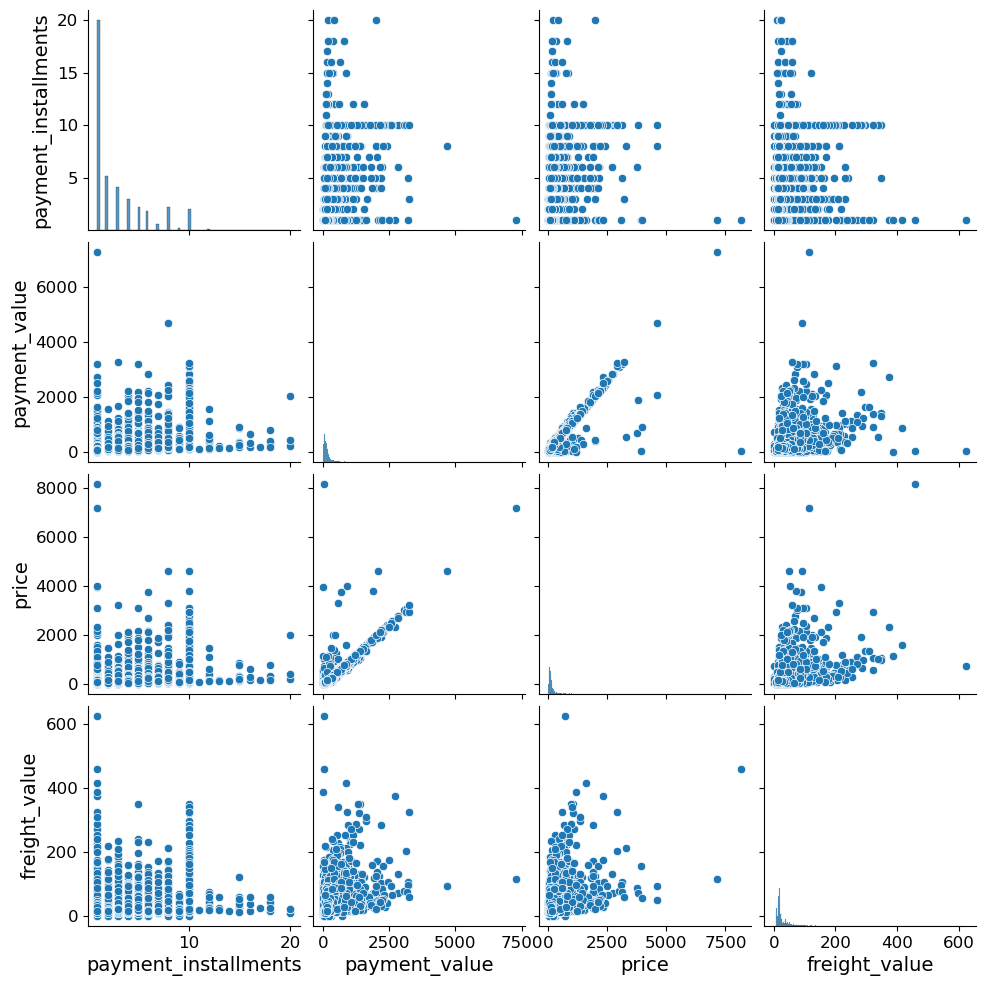

In [18]:
sns.pairplot(df_orders)

We analyzed more in detail the distribution of order price. First by looking at the summary variable and then by visualizing it. From the data below, it is possible to understand how the distribution is very skewed and not evenly distributed since we have a mean of 156 and max of 8160. It is important to highlight how 75% of the observations are below 160 euros, a huge difference with the max price of 8160 signaling the presence of outliers or anomalies.  

In [19]:
df_orders["price"].describe()

count    11332.000000
mean       156.992773
std        266.173100
min          4.900000
25%         49.900000
50%         95.340000
75%        159.980000
max       8160.120000
Name: price, dtype: float64

Here we can better see how the price distribution is highly right skewed.

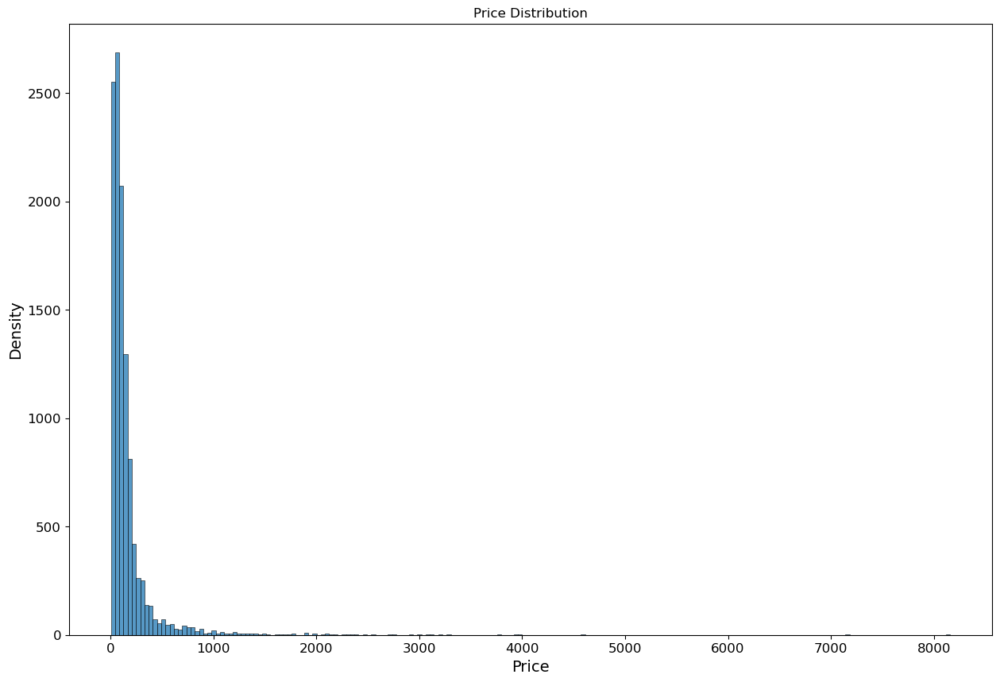

In [20]:
plt.figure(figsize=(15, 10))

sns.histplot(df_orders["price"], bins=200)

plt.title("Price Distribution")
plt.xlabel("Price")
plt.ylabel("Density")

plt.show()

### Categorical variables

We plot two different visualizations to understand the distirbution of customer city in the dataset. The first one is a map, where red points represents all customer cities. The size of those points represents the frequency of each city. 
In order to realize this map, at first, we need two external dataframe : the one from geobr library ('states'), that allows us to draw the map, and one containing all brazilian cities ('br_cities'). Then we merge our dataset grouped by city ('df_grouped_city') with 'br_cities', and transform the resulting dataset into GeoDataFrame. Finally, we plot the map of Brazil and then we add the red points.

P.S. the code of the map visualization below has always worked until 5/17/2023, however in the last runs sometimes it gave the following error:'some internal url is broken.Please report to https://github.com/ipeaGIT/geobr/issues'. Since it does work in some moments, and in others it does not, we believe there are some problems specific with the url that does not depend on us. In case this chunk did not work we recommend continuing running from the Data Pre-processing.

In [21]:
warnings.filterwarnings('ignore')
states = geobr.read_state(year=2019)

br_cities=pd.read_csv('br.csv')
geometry = [Point(xy) for xy in zip(br_cities['lng'], br_cities['lat'])]
br_cities["city"] = br_cities["city"].str.lower()

df_grouped_city=df_orders.groupby('customer_city')['price'].count().reset_index(name='count')
br_cities_city = br_cities.merge(df_grouped_city, how="left", left_on="city", right_on="customer_city")
gdf = GeoDataFrame(br_cities_city, geometry=geometry) 

#AGGIUNGERE CITY LABEL
fig, ax = plt.subplots(figsize=(15, 15), dpi=300)
states.plot(facecolor="#2D3E50", edgecolor="#FEBF57", ax=ax)
gdf.plot(ax=ax, marker='o', color='red', markersize='count')
ax.set_title("Customer city", fontsize=40)
ax.axis("off")                      
fig.savefig('demo.png', transparent=True)



Exception: Some internal url is broken.Please report to https://github.com/ipeaGIT/geobr/issues

From this map, we better understand the distribution of the customers' cities that made the orders. Customers are not uniformly distributed in Brazil but they mainly come from the south-east coast. 

The second visualization analyzes more specifically from which cities the majority of orders come from by showing the 10 most frequent cities. To do that, we sorted the dataframe which contains all cities with the respective count, and we take it the top 10 values. Then we plot them in descending order on a barplot.  

In [22]:
df_grouped_city = df_grouped_city.sort_values(by="count", ascending=False)
top10_cities = df_grouped_city.head(10)

fig = px.bar(top10_cities, x="customer_city", y="count")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

NameError: name 'df_grouped_city' is not defined

From the bar chart we can notice how most of the orders are made from San paolo. Then in smaller scale we have rio de jainero and belo horizonte in second and third position 

We then proceed by analyzing the distribution of the seller shops. We reapeted the exact same procedure with the only difference on the first line. We grouped, in fact, for seller city.

In [26]:
df_grouped_city_seller=df_orders.groupby('seller_city')['price'].count().reset_index(name='count')
br_cities_seller = br_cities.merge(df_grouped_city_seller, how="left", left_on="city", right_on="seller_city")
gdf = GeoDataFrame(br_cities_seller, geometry=geometry) 


fig, ax = plt.subplots(figsize=(15, 15), dpi=300)
states.plot(facecolor="#2D3E50", edgecolor="#FEBF57", ax=ax)
gdf.plot(ax=ax, marker='o', color='red', markersize='count')
ax.set_title("Seller city", fontsize=40)
ax.axis("off")                      
fig.savefig('demo.png', transparent=True)

NameError: name 'br_cities' is not defined

We can see how almost every order is managed by shops located in the south-east coast, while there are almost no sellers elsewhere.

In [27]:
df_grouped_city_seller = df_grouped_city_seller.sort_values(by="count", ascending=False)
top10_sellers = df_grouped_city_seller.head(10)

fig = px.bar(top10_sellers, x="seller_city", y="count")
fig.update_layout(xaxis = {"categoryorder":"total descending"})
fig.show()

## Data Pre-processing

In this section we create the three variables that are needed for Rfm customer segmentation.

### Frequency

We obtain the Frequency by grouping by 'customer_unique_id' and counting the values.

In [28]:
df_frequency = df_orders.groupby("customer_unique_id")["price"].count().reset_index(name="Frequency")
df_frequency['Frequency'].value_counts()

1    11048
2      130
3        8
Name: Frequency, dtype: int64

### Recency

Evaluating Recency implies an additional step. After grouping by 'customer_unique_id' and taking the last date of purchase for each customer, we take as reference point the last purchase made in the dataset ('recent_date'). Then we calculated the difference between each purchase with respect to 'recent_date'. We append our new column to the dataset and we drop the column containg the 'raw' date.

In [29]:
df_recency = df_orders.groupby('customer_unique_id')['order_purchase_timestamp'].max().reset_index(name="LastPurchaseDate")
recent_date = df_recency['LastPurchaseDate'].max()
df_recency['Recency'] = df_recency['LastPurchaseDate'].apply(lambda x: (recent_date - x).days)
df_recency = df_recency.drop(["LastPurchaseDate"], axis=1)
df_recency

,customer_unique_id,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,111
1,000ec5bff359e1c0ad76a81a45cb598f,8
2,00172711b30d52eea8b313a7f2cced02,32
3,001928b561575b2821c92254a2327d06,4
4,0019e8c501c85848ac0966d45226fa1d,120
...,...,...
11181,ffecceca389973ef16660d58696f281e,126
11182,ffee94d548cef05b146d825a7648dab4,32
11183,fff2ae16b99c6f3c785f0e052f2a9cfb,131
11184,fff3e1d7bc75f11dc7670619b2e61840,40


### Monetary

We obtain the Monetary value by grouping by 'customer_unique_id' and summing all price values.

In [30]:
df_monetary = df_orders.groupby("customer_unique_id")["price"].sum().reset_index(name="monetary_value")
df_monetary

,customer_unique_id,monetary_value
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90
1,000ec5bff359e1c0ad76a81a45cb598f,14.96
2,00172711b30d52eea8b313a7f2cced02,74.50
3,001928b561575b2821c92254a2327d06,136.89
4,0019e8c501c85848ac0966d45226fa1d,159.99
...,...,...
11181,ffecceca389973ef16660d58696f281e,59.90
11182,ffee94d548cef05b146d825a7648dab4,27.90
11183,fff2ae16b99c6f3c785f0e052f2a9cfb,129.94
11184,fff3e1d7bc75f11dc7670619b2e61840,54.85


## Merged dataset

Finally, we merge all these datasets ('df_frequency', 'df_recency', 'df_monetary'), into one dataset and we drop the 'customer_unique_id' column.

In [31]:
df_merged = df_frequency.merge(df_recency,left_on = "customer_unique_id",  right_on="customer_unique_id")
df_merged_rfm = df_merged.merge(df_monetary,left_on = "customer_unique_id",  right_on="customer_unique_id")
df_final = df_merged_rfm.drop(["customer_unique_id"], axis=1)

Here we plot the three variable distribution. We initialize the grid and then we assign each subplot to a row.

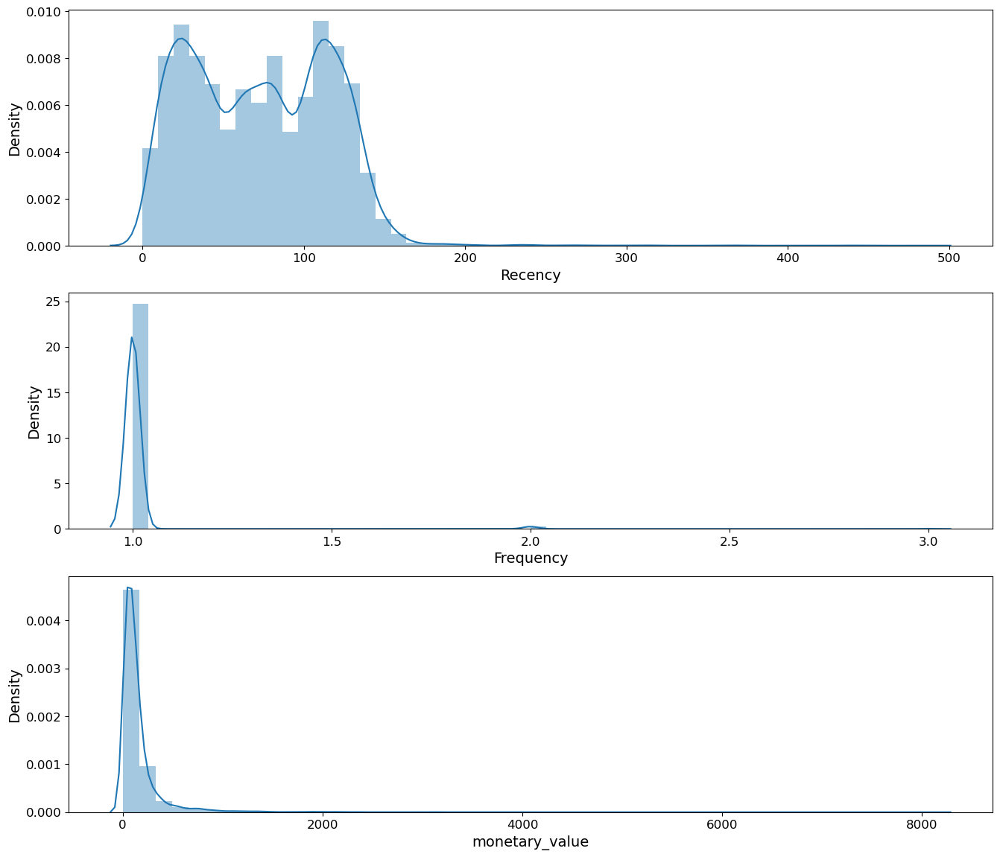

In [32]:
# Plot RFM distributions
plt.figure(figsize=(16,14))
# Plot distribution of R
plt.subplot(3, 1, 1); sns.distplot(df_final['Recency'])
# Plot distribution of F
plt.subplot(3, 1, 2); sns.distplot(df_final['Frequency'])
# Plot distribution of M
plt.subplot(3, 1, 3); sns.distplot(df_final['monetary_value'])
plt.savefig("distribution1.png")
# Show the plot
plt.show()


Here, indeed, we plot the static 3D scatterplot of our dataset with Recency, Frequency and Monetary value.

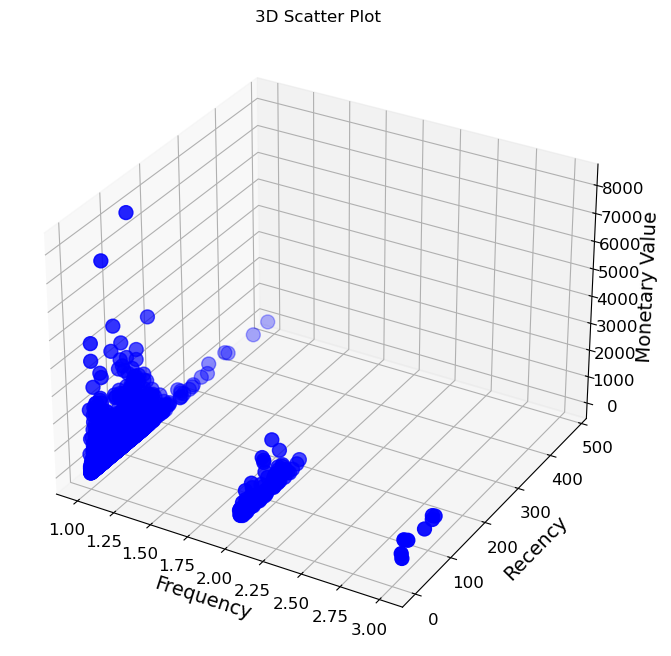

In [33]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# plot the data points
ax.scatter(df_final["Frequency"], df_final["Recency"], df_final["monetary_value"], s=100, c='b', marker='o')

# set labels and title
ax.set_xlabel('Frequency')
ax.set_ylabel('Recency')
ax.set_zlabel('Monetary Value')
ax.set_title('3D Scatter Plot')

# show the plot
plt.show()

## Standard Scaler

The range of variables shows large variation. Many clustering methods are distance based, so adjusting variables' ranges is required to avoid building biased or imbalanced model. So, we import the StandardScaler, we fit it and we apply it to our dataset.

In [34]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(df_final)
X = scaler.transform(df_final)

Then we change the name of the resulting matrix, making it a dataframe.

In [35]:
df_scaled = pd.DataFrame(X, columns = ['frequency_scaled','recency_scaled','monetary_scaled'])

We plot again the 3D scatterplot to see how the new dataset looks like

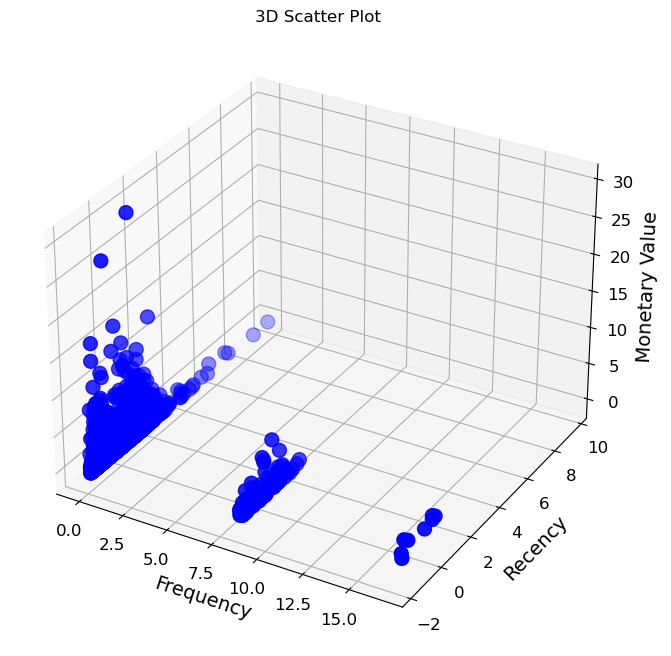

In [36]:
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')

# plot the data points
ax.scatter(df_scaled["frequency_scaled"], df_scaled["recency_scaled"], df_scaled["monetary_scaled"], s=100, c='b', marker='o')

# set labels and title
ax.set_xlabel('Frequency')
ax.set_ylabel('Recency')
ax.set_zlabel('Monetary Value')
ax.set_title('3D Scatter Plot')

# show the plot
plt.show()

# Models

## K-means

### WCSS

We first try the K-Means as baseline model. With K-Means, the number of clusters must be established before. Therefore, we decide the number of k by looking at the WCSS and the Silouhette Score.

Here we use the Elbow method to find the optimal number of cluster. 
We create an empty list ('wcss') and then we apply K-Means from 1 to 12 clusters. At each iteration we evaluate the WCSS and we store it into 'wcss'. Then we plot the results. On the x-axis we have the value of k, while on the y-axis we have the WCSS.

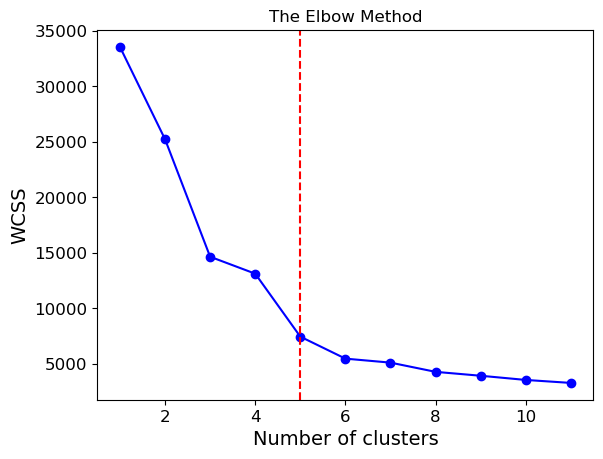

In [37]:
wcss = []
for i in range(1, 12):
    kmeans = KMeans(n_clusters = i, init = 'random',n_init= 10 , random_state = 42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 12), wcss,'bo-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.axvline(x = 5, color = 'red', linestyle='dashed')
plt.show()

From the graph we can see how the elbow is at k = 5, with a WCSS value of 7454.

In [38]:
wss_kmeans=wcss[4]
wss_kmeans

7453.920243234486

### Silhouette Score

Then we check the Silhouette Score. We import the metrics from Sklearn, we build an empty list ('sil_avg'), and for k in range from 1 to 12, we apply K-Means (changing k), and evaluate the Silhouette Score. Then we plot the result.

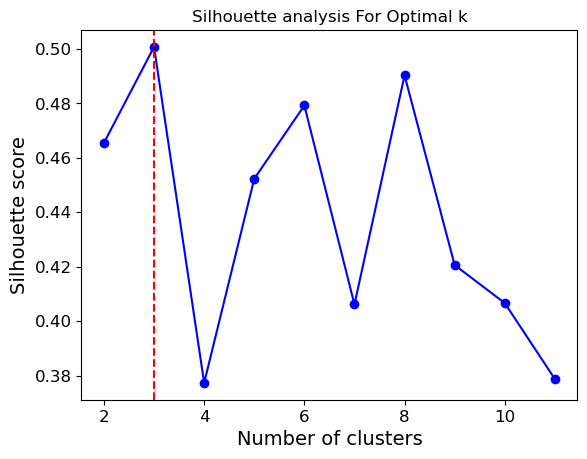

In [39]:
sil_avg = []
for k in range(2,12):
    kmeans = KMeans(n_clusters = k,init = "random", n_init=10 ,random_state=42).fit(X)
    labels = kmeans.labels_
    sil_avg.append(silhouette_score(X , labels, metric = 'euclidean'))

plt.plot(range(2, 12),sil_avg,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.axvline(x = 3, color = 'red', linestyle='dashed')
plt.show()

The Silhouette Score highlights that three is the optimal number of clusters according to that metric. For what concerns the WCSS, k equal 3 could be a suboptimal solution. So we decided to implement k-means with three clusters.

In [40]:
silhouette_kmeans=sil_avg[1]
silhouette_kmeans

0.5007157258585413

### K-Means Implementation

We apply K-Means with three clusters and append the labels to the scaled dataset.

In [41]:
kmeans = KMeans(n_clusters = 3, init = 'random', n_init=10, random_state = 42)
kmeans_clusters = kmeans.fit_predict(X)
df_scaled["cluster_kmeans"] =kmeans_clusters

Then we plot it in 3D.

In [42]:
fig = px.scatter_3d(df_scaled, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster_kmeans')
fig.show()

## K-Means ++

### WCSS

Following the same procedure of K-Means, we start by deciding the optimal number of k thorugh the WCSS and the Silhouette Score.
The only difference concerns the implementation of the clustering algorithm. Instead of random 'init', we put 'k-means++' 

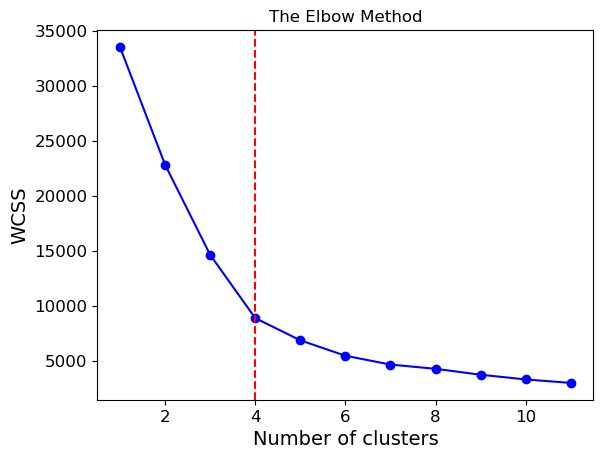

In [43]:
wcss_1= []
for i in range(1, 12):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',n_init= 10 , random_state = 42)
    kmeans.fit(X)
    wcss_1.append(kmeans.inertia_)

plt.plot(range(1, 12), wcss_1,'bo-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.axvline(x = 4, color = 'red', linestyle='dashed')
plt.show()

From the graph we can see how the elbow is at k = 4, with a WCSS value of 6874.

In [44]:
wss_kmeans_plus=wcss_1[4]
wss_kmeans_plus

6874.532652528099

### Silhouette Score

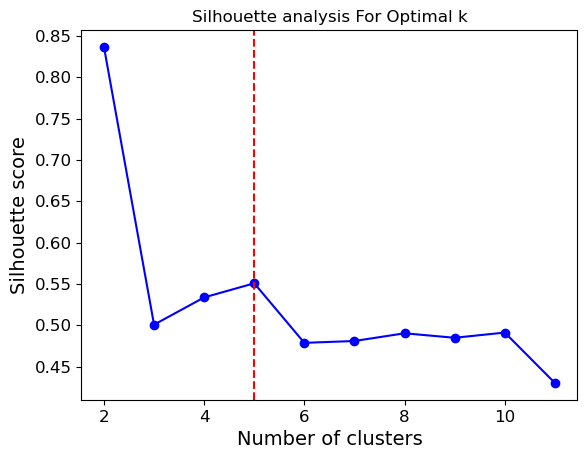

In [45]:
from sklearn.metrics import silhouette_score
sil_avg_1= []
for k in range(2,12):
    kmeans = KMeans(n_clusters = k,init = "k-means++", n_init=10 ,random_state=42).fit(X)
    labels = kmeans.labels_
    sil_avg_1.append(silhouette_score(X , labels, metric = 'euclidean'))

plt.plot(range(2, 12),sil_avg_1,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.axvline(x = 5, color = 'red', linestyle='dashed')
plt.show()

The optimal WCSS value is with 4 clusters, while the optimal k according to the Silhouette Score is 5. Since the difference for WCSS is not so significant, we choose to apply k-means++ with 5 clusters with a Silhoutte score of 0.55

In [46]:
silhouette_kmeans_plus=sil_avg_1[3]
silhouette_kmeans_plus

0.550753637722771

### K-means++ Implementation

We apply K-Means++ with five clusters and append the labels to the scaled dataset.

In [47]:
kmeans_plus = KMeans(n_clusters = 5, init = 'k-means++', n_init=10, random_state = 42)
kmeans_cluster_plus = kmeans_plus.fit_predict(X)
df_scaled["cluster_kmeans_plus"] =kmeans_cluster_plus

Then we plot it.

In [48]:
fig = px.scatter_3d(df_scaled, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster_kmeans_plus')
fig.show()

## Hierarchical Clustering

After having implemented K-Means and K-Means++, the netx step is to implement Hierarchical Clustering. The process is always the same, with the exception of the dendogram representation.

### WCSS

The AgglomerativeClustering function has not the built-in WCSS evaluation. So we had to build a function that evauate it.
The code below for the evaluation of the elbow method for hiearchical clustering was copied by an internet source.

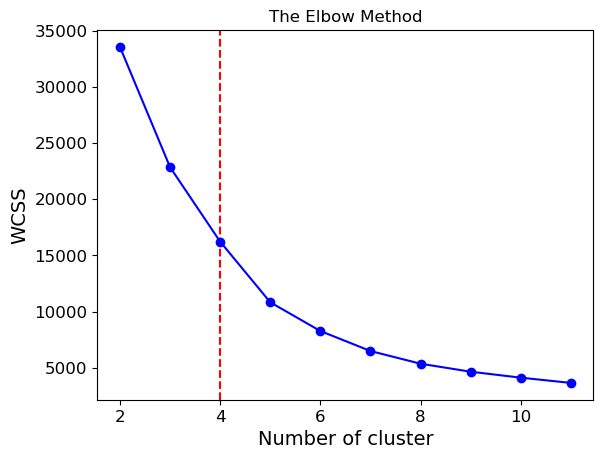

In [49]:
def wss_calculation(K, data):
    WSS = []
    for i in range(K):
        cluster = AgglomerativeClustering(n_clusters= i+1, affinity='euclidean', linkage='ward')  
        cluster.fit_predict(data)
        # cluster index
        label = cluster.labels_
        wss = []
        for j in range(i+1):
            # extract each cluster according to its index
            idx = [t for t, e in enumerate(label) if e == j]
            cluster = data[idx,]
            # calculate the WSS:
            cluster_mean = cluster.mean(axis=0)
            distance = np.sum(np.abs(cluster - cluster_mean)**2,axis=-1)
            wss.append(sum(distance))
        WSS.append(sum(wss))
    return WSS

WSS=wss_calculation(10, X)

cluster_range = range(1, 11)

plt.title('The Elbow Method')
plt.xlabel('Number of cluster')
plt.ylabel('WCSS')
plt.axvline(x = 4, color = 'red', linestyle='dashed')
plt.plot(range(2, 12),WSS,'bo-')
plt.show()

The elbow shape is at k equal 4 with a wcss of 8267

In [50]:
wss_hierarchical= WSS[4]
wss_hierarchical

8267.685743599784

### Silhouette score

Here we compute the Silhouette score for a range of possible clusters going from 2 to 10

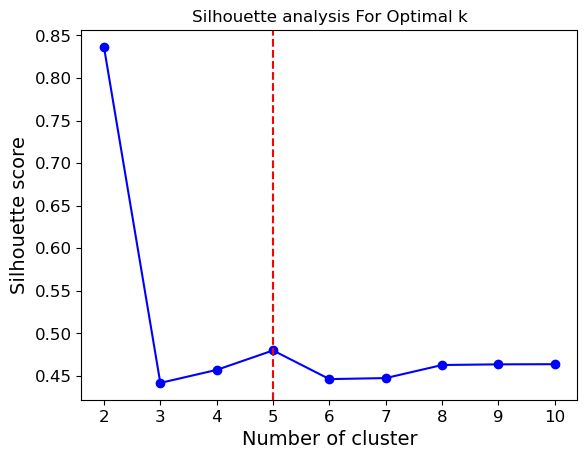

In [51]:
sil_avg_3 = []
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9 , 10]

for k in range_n_clusters:
    ac= AgglomerativeClustering(n_clusters=k).fit(X)
    y_pred = ac.labels_
    sil_avg_3.append(silhouette_score(X , y_pred, metric = 'euclidean'))

plt.plot(range_n_clusters,sil_avg_3,'bo-')
plt.xlabel('Number of cluster')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.axvline(x = 5, color = 'red', linestyle='dashed')
plt.show()

The Silhouette score is 0.47 for 5 clusters

In [52]:
silhouette_hierarchical=sil_avg_3[3]
silhouette_hierarchical

0.4799120637595943

### Dendrogram

Here we plot the dendrogram, a graphical visualization in order to understand which is the optimal cutoff point 

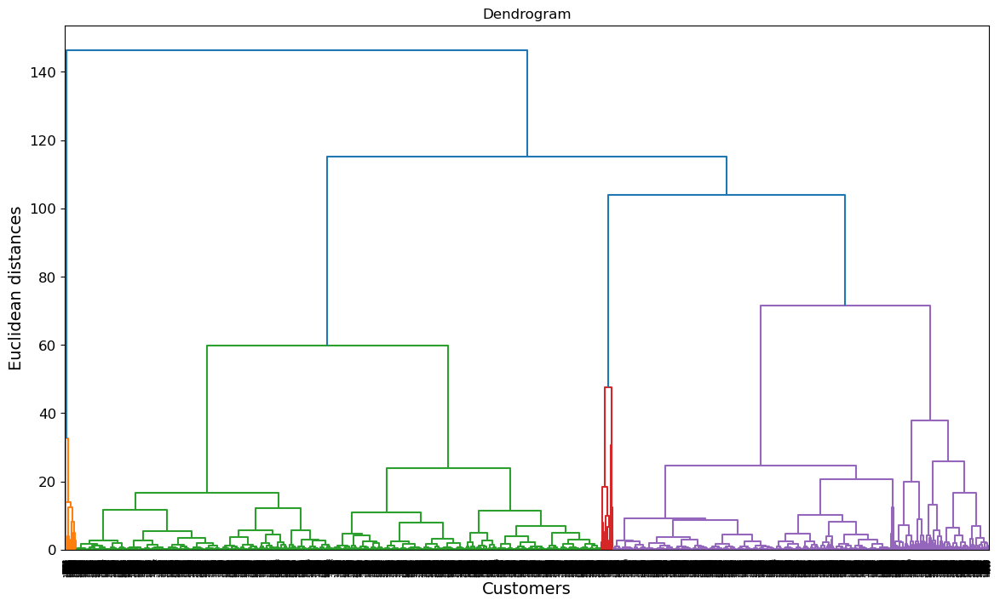

In [53]:
plt.figure(figsize = (14, 8))
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward', metric= "euclidean"))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

From the dendogram and from WCSS the optimal number of k seems to be 4 while Silhhouette Score suggests 5. We decided to implement Agglomerative Clusters with k=4.

### Hierarchical Clustering Implementation

We apply Agglomerative Clustering with four clusters and append the labels to the scaled dataset.

In [54]:
ac= AgglomerativeClustering(n_clusters=4).fit(X)
ac_clusters = ac.labels_
df_scaled["cluster_ac"] =ac_clusters

Then we plot it.

In [55]:
fig = px.scatter_3d(df_scaled, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster_ac')
fig.show()

## DBSCAN

Here, we try to implemenent DBSCAN for clustering purpose. We create an algorithm that iteratively tries every combination of epsilon and lambda to evaluate the model with the highest silhouette score. The values of epsilon, which is the lenght of the radius, ranges from 0.1 to 2.0, while lambda, which is the minimum number of data points to be categorised as a cluster, goes from 1 to 30. 

P.S. The code below takes a lot of time to run(on my computer 30 to 45 minutes). You might want to skip it and proceed with the next chunks. They contain the final number returned by this code. 

In [56]:
best_silhouette_cluster=0
best_eps_cluster=0
best_min_sample_cluster=0
for x in range(1,20,1):
    x=x/10
    for y in range(1,30):
        db = DBSCAN(eps=x, min_samples=y).fit(X)
        labels = db.labels_
        score_cluster=metrics.silhouette_score(X, labels)
        if score_cluster>best_silhouette_cluster:
            best_silhouette_cluster=score_cluster
            best_eps_cluster=x
            best_min_sample_cluster=y

In [57]:
best_parameters_cluster=[best_silhouette_cluster, best_eps_cluster, best_min_sample_cluster]
best_parameters_cluster

[0.829792711199681, 1.6, 4]

The parameters resulting are: epsilon 1.6, lambda 4, for a silhouette method of 0.830.

Below is the visualization with the parameters that result in the best Silhouette score. It can be noticed how the partition of the data points is only driven by the Frequency variable, making the DBscan not optimal for clustering purposes.

In [58]:
db = DBSCAN(eps=1.6, min_samples=4).fit(X)
db_cluster = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(db_cluster)) - (1 if -1 in db_cluster else 0)
n_noise_ = list(db_cluster).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

# this step adds an extra column indicating the cluster number for each country
df_scaled["cluster_dbscan"] =db_cluster

df_scaled["cluster_dbscan"].value_counts()

#Visualization with 5 clusters 
fig = px.scatter_3d(df_scaled, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster_dbscan')
fig.show()

Estimated number of clusters: 3
Estimated number of noise points: 10


## Managing Anomalies

The k-means ++ does an optimal job in finding the clusters, therefore we decided to chose that method. However we have seen how in the dataset there are some anomalies, extreme observations that have values out of the ordinary. Since the k-means is very sensible to anomalies, the ssignation of the centroid will be attracted towards these extreme points. In order to avoid that we are going to follow these steps:
- detecting the anomalies through Dbscan
- Removing the anomalies 
- Applied the k-means on the remaining customers 
- Applying the k-means on the anomalies
- Grouping the results

### Dbscan

By applying the DB Scan and tuning the two parameters we were able to detect 43 anomalies: the blue points

P.S. The code below might take few minutes to run.

In [59]:
best_silhouette=0
best_eps=0
best_min_sample=0
for x in range(1,10,1):
    x=x/10
    for y in range(5,15):
        db = DBSCAN(eps=x, min_samples=y).fit(X)
        labels = db.labels_
        score=metrics.silhouette_score(X, labels)
        if score>best_silhouette:
            best_silhouette=score
            best_eps=x
            best_min_sample=y

The best parameters that yields the highest silhouette score are best_eps= 0.8 and best_min_sample = 5

In [60]:
best_parameters=[best_silhouette, best_eps, best_min_sample]
best_parameters

[0.8279223551513851, 0.8, 5]

In [61]:
db = DBSCAN(eps=0.8, min_samples=5).fit(X)
db_cluster = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(db_cluster)) - (1 if -1 in db_cluster else 0)
n_noise_ = list(db_cluster).count(-1)

print("Estimated number of clusters: %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)

# this step adds an extra column indicating the cluster number for each country
df_scaled["cluster_dbscan"] =db_cluster

df_scaled["cluster_dbscan"].value_counts()

#Visualization with 5 clusters 
fig = px.scatter_3d(df_scaled, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster_dbscan')
fig.show()

Estimated number of clusters: 2
Estimated number of noise points: 43


## K-Means ++ without anomalies

We remove anomalies so that we can apply the k-means on the remaining observations by filtering the one with label different from -1 in 'cluster_dbscan' column.

In [62]:
db_no_out=df_scaled[df_scaled['cluster_dbscan']!=-1]
db_no_out=db_no_out.drop(['cluster_kmeans','cluster_kmeans_plus','cluster_ac','cluster_dbscan'], axis=1)

Then we repeat once again process of k selection and k-means++ implementatation.

### WCSS

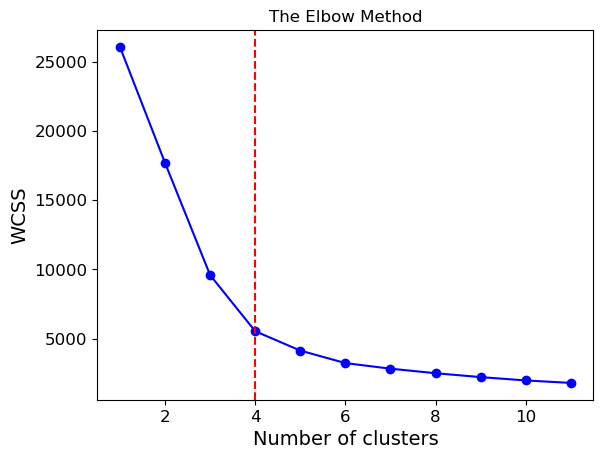

In [63]:
wcss_4 = []
for i in range(1, 12):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',n_init= 10 , random_state = 42)
    kmeans.fit(db_no_out)
    wcss_4.append(kmeans.inertia_)

plt.plot(range(1, 12), wcss_4,'bo-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.axvline(x = 4, color = 'red', linestyle='dashed')
plt.show()

In [64]:
wss_kmeans_plus_no_out= wcss_4[3]
wss_kmeans_plus_no_out

5530.795579212099

### Silhouette Score

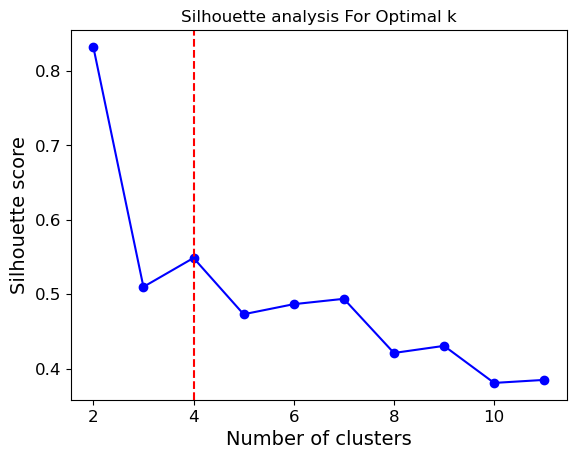

In [65]:
from sklearn.metrics import silhouette_score
sil_avg_4 = []
for k in range(2,12):
    kmeans = KMeans(n_clusters = k,init = "k-means++", n_init=10 ,random_state=42).fit(db_no_out)
    labels = kmeans.labels_
    sil_avg_4.append(silhouette_score(db_no_out , labels, metric = 'euclidean'))

plt.plot(range(2, 12),sil_avg_4,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.axvline(x = 4, color = 'red', linestyle='dashed')
plt.show()

In [66]:
silhouette_kmeabs_plus_no_out=sil_avg_4[2]
silhouette_kmeabs_plus_no_out

0.5486081742992428

As it is clear from the plots above, WCSS and Silhouette Score converge to k=4.

### K-means++ without outlier Implementation

We apply k-means++ on the dataset without anomalies with four clusters and append the labels to the dataset.

In [67]:
kmeans_no_out = KMeans(n_clusters = 4, init = 'k-means++', n_init=10, random_state = 42)
kmeans_cluster_no_out = kmeans_no_out.fit_predict(db_no_out)
db_no_out["cluster"] = kmeans_cluster_no_out

After that, we plot it.

In [68]:
fig = px.scatter_3d(db_no_out, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster')
fig.show()

## K means++ with only outliers

Than we isolate anomalies and cluster that through k-means++. So we filter observation with 'cluster_dbscan' equals to -1.

In [69]:
db_outliers=df_scaled[df_scaled['cluster_dbscan']==-1]
db_outliers=db_outliers.drop(['cluster_kmeans','cluster_kmeans_plus','cluster_ac','cluster_dbscan'], axis=1)

### WCSS

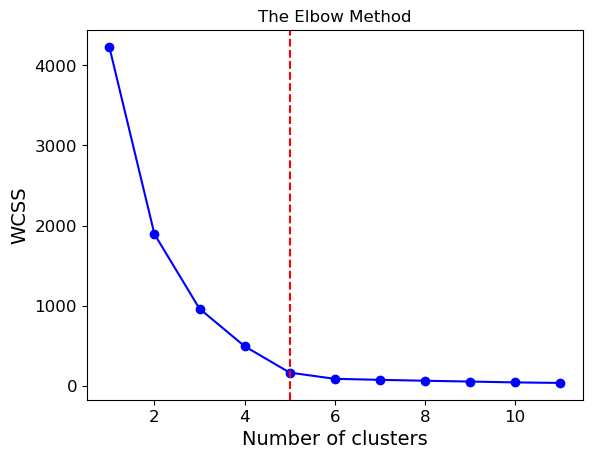

In [70]:
wcss_5 = []
for i in range(1, 12):
    kmeans = KMeans(n_clusters = i, init = 'k-means++',n_init= 10 , random_state = 42)
    kmeans.fit(db_outliers)
    wcss_5.append(kmeans.inertia_)

plt.plot(range(1, 12), wcss_5,'bo-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.axvline(x = 5, color = 'red', linestyle='dashed')
plt.show()

### Silhouette Score

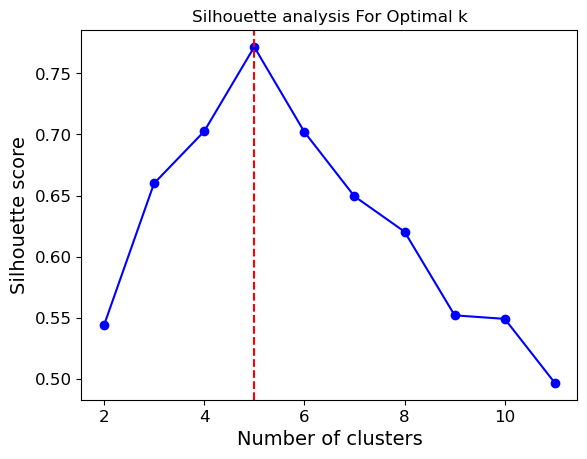

In [71]:
from sklearn.metrics import silhouette_score
sil_avg_5 = []
for k in range(2,12):
    kmeans = KMeans(n_clusters = k,init = "k-means++", n_init=10 ,random_state=42).fit(db_outliers)
    labels = kmeans.labels_
    sil_avg_5.append(silhouette_score(db_outliers , labels, metric = 'euclidean'))

plt.plot(range(2, 12),sil_avg_5,'bo-')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k')
plt.axvline(x = 5, color = 'red', linestyle='dashed')
plt.show()

For this small dataset it is clear tht 5 is the best number of clusters.

### K-means++ with only anomalies implementation

We apply k-means++ on the anomalies dataset and we append the cluster column. 

In [72]:
kmeans_out = KMeans(n_clusters = 5, init = 'k-means++', n_init=10, random_state = 42)
kmeans_out_custers = kmeans_out.fit_predict(db_outliers)
db_outliers["cluster"] =kmeans_out_custers

Here below we plot the outliers datapoints to understand the anomalies clusters 

In [73]:
fig = px.scatter_3d(db_outliers, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster')
fig.show()

## Merging clusters result

In order to merge the two clusters results, we change the anomalies cluster labels, mapping them from 4 to 8.

In [74]:
clusters_outliers= db_outliers['cluster'].map({0: 4, 1: 5,2: 6, 3: 7,4:8})
db_outliers['cluster']=clusters_outliers

Then we concatenate the dataset with 'core' observations and the one with anomalies.

In [75]:
frames=[db_outliers, db_no_out]
df_final_clusters=pd.concat(frames)
df_final_clusters['cluster'].value_counts()

0    5318
1    5286
3     418
2     121
6      18
7       9
4       8
5       6
8       2
Name: cluster, dtype: int64

We create a temporaney variable ('temp1') beacuse we need to drop cluster column in order to evaluate the Silhouette Score.

In [76]:
df_temp=df_final_clusters.drop(columns=['cluster'])
silhouette_score(df_temp, df_final_clusters['cluster'])

0.5453867276220491

Then we mutate cluster column to category type and plot it.

In [77]:
df_final_clusters['cluster']=df_final_clusters['cluster'].astype('category')

fig = px.scatter_3d(df_final_clusters, x="frequency_scaled", y="recency_scaled", z="monetary_scaled", color='cluster')
fig.update_layout(showlegend=False)
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False, showaxeslabels=True),
        yaxis=dict(showticklabels=False, showaxeslabels=True),
        zaxis=dict(showticklabels=False, showaxeslabels=True),
    ))
fig.show()

## Cluster Analysis

The first step of the analysis is the centroids visualization. We sort the dataset with label in order to append them to the non-scaled dataset. Then we drop unnecessary column and finally we group by cluster and evalueate the mean.

In [78]:
df_final_clusters=df_final_clusters.sort_index()
df_final['cluster']=df_final_clusters['cluster']
df_final

,Frequency,Recency,monetary_value,cluster
0,1,111,129.90,1
1,1,8,14.96,0
2,1,32,74.50,0
3,1,4,136.89,0
4,1,120,159.99,1
...,...,...,...,...
11181,1,126,59.90,1
11182,1,32,27.90,0
11183,1,131,129.94,1
11184,1,40,54.85,0


In [79]:
df_centroids=df_final.groupby('cluster').mean()
df_centroids

,Frequency,Recency,monetary_value
cluster,,,
0,1.0,36.030463,113.621452
1,1.0,109.237798,121.199561
2,2.0,58.818182,211.333223
3,1.0,78.930622,1001.178565
4,3.0,69.125000,418.128750
5,1.0,377.833333,182.815000
6,1.0,76.388889,3320.696667
7,2.0,63.444444,1171.533333
8,1.0,77.500000,7660.060000


The we transposed the centroids dataframe in order to create the three different datasets that will be needed for the visualization 

In [80]:
df_t = df_centroids.T
frequency_barplot=pd.DataFrame(df_t.iloc[0])
recency_barplot=pd.DataFrame(df_t.iloc[1])
monetary_barplot=pd.DataFrame(df_t.iloc[2])

Th first step for the visualization is creating a color map that matches the clusters colors in the previous plot.

In [81]:
color_map = {
    '0': '#ff6692',
    '1': '#19d3f3',
    '2': '#ff97ff',
    '3': '#b6e880',
    '4': '#00cc96',
    '5': '#ab63fa',
    '6': '#ef553b',
    '7': '#636efa',
    '8': '#ffa15a'
}

Then we create the figure in order to make subplots. We need to specify in advance the structure ( 1 column, 3 row), and each plot title.

In [82]:
fig = make_subplots(rows=3, cols=1,subplot_titles=("Frequency", "Recency", "Monetary Value"))

After that, we add one at time the barplot containg the cluster mean for one variable. Before showing the figure, we hide the legend and specify the size

In [83]:
fig.add_trace(
    go.Bar(x=recency_barplot.index, y=recency_barplot.Recency, marker_color=list(color_map.values())),
    row=1, col=1
)

fig.add_trace(
    go.Bar(x=frequency_barplot.index, y=frequency_barplot.Frequency,marker_color=list(color_map.values())),
    row=2, col=1
)

fig.add_trace(
    go.Bar(x=monetary_barplot.index, y=monetary_barplot.monetary_value, marker_color=list(color_map.values())),
    row=3, col=1
)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    )


fig.update_layout(showlegend=False)


## Cluster Analysis Categorical Value

### Product Category

We insert to the rfm dataset the final cluster labels and then we merge it with the original dataframe called 'df', based on unique customer id. Then we grouped this dataset by cluster and category, obtaining the count for each custer.

In [84]:
df_merged_rfm['cluster']=df_final_clusters['cluster']
df_merged_rfm = df_merged_rfm.merge(df,left_on = "customer_unique_id",  right_on="customer_unique_id")
df_grouped_cluster=df_merged_rfm.groupby(['cluster', 'product_category_name_english']).count()['Frequency'].reset_index(name='counts')
df_grouped_cluster

,cluster,product_category_name_english,counts
0,0,agro_industry_and_commerce,12
1,0,air_conditioning,19
2,0,art,34
3,0,arts_and_craftmanship,8
4,0,audio,30
...,...,...,...
589,8,stationery,0
590,8,tablets_printing_image,0
591,8,telephony,0
592,8,toys,0


In order to visualize the percentage of product category for each cluster, we thought that a pie chart could be a good solution. In the for loop, for 9 times, we filter the dataset created above in order consider just one cluster at time. Then, we sort the resulting dataframe and we take the top 5 categories. The other ones are grouped under the 'others' label. An exception is made for cluster number 5 ad 8, which have less then 5 categories in total. After this step, each pie chart is plotted.

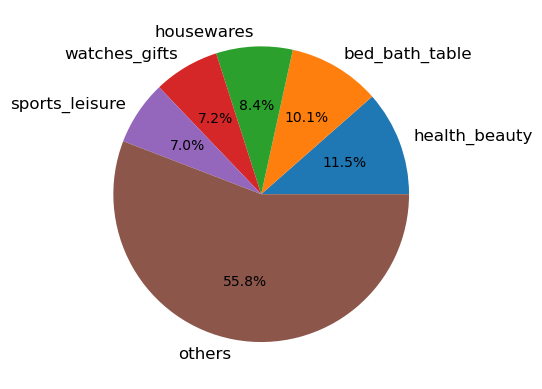

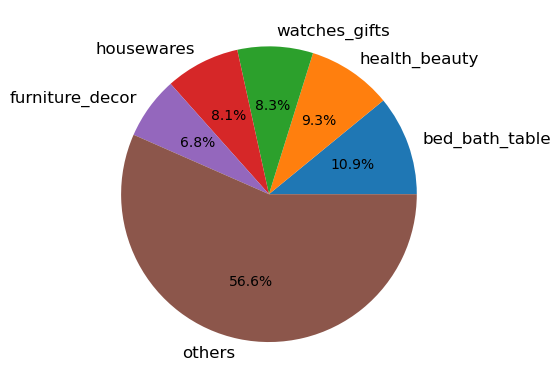

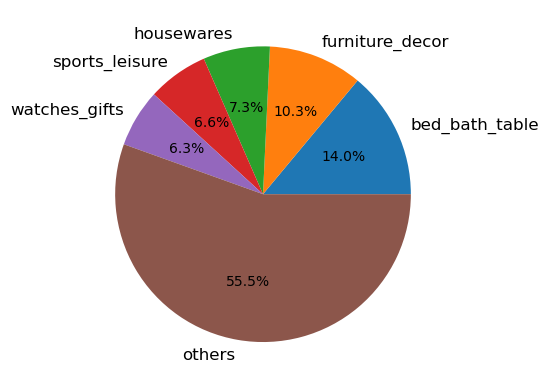

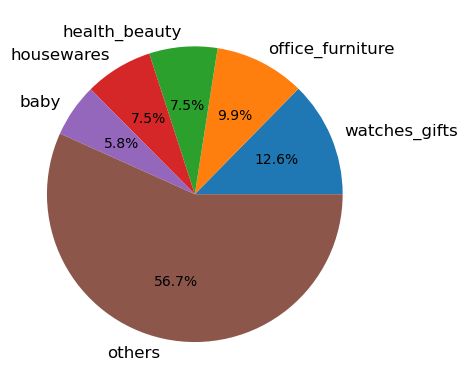

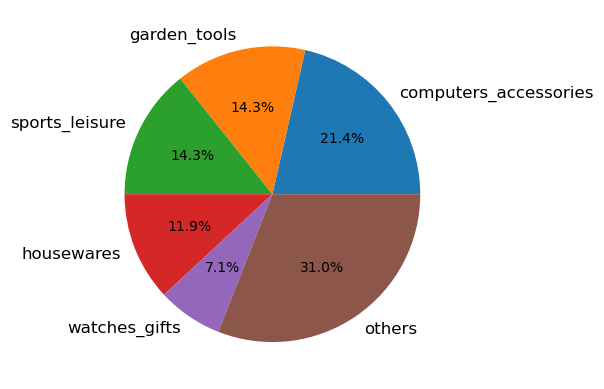

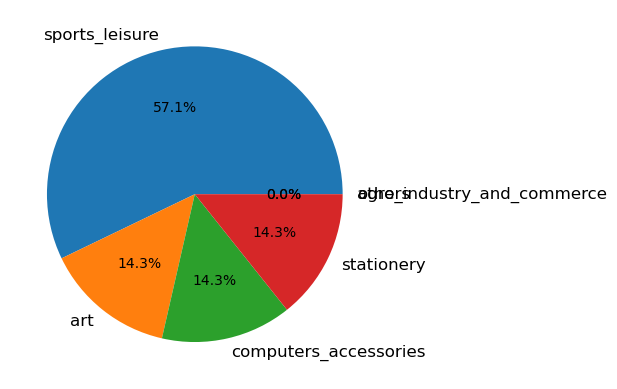

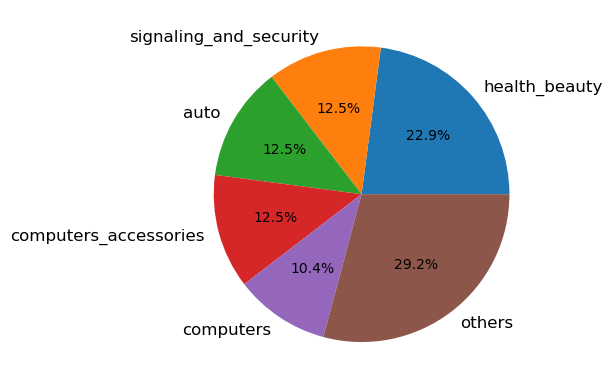

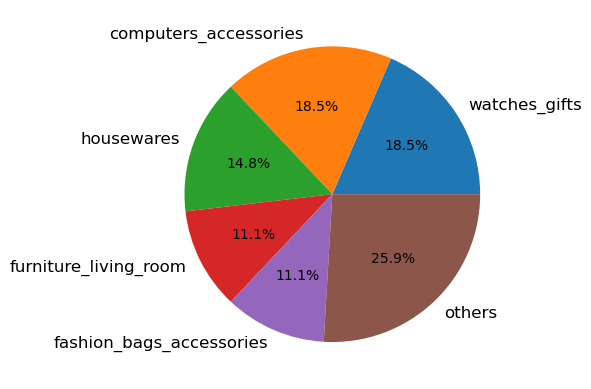

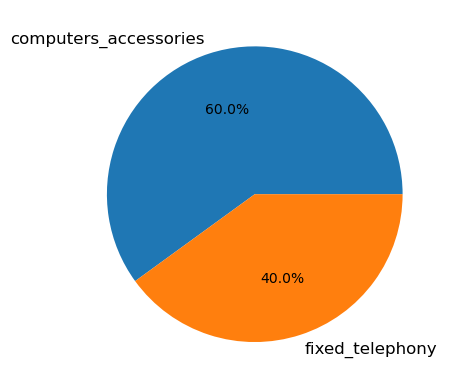

In [85]:
for x in range (0,9):
    df_grouped_cluster0=df_grouped_cluster[df_grouped_cluster['cluster']==x]
    df_grouped_cluster0=df_grouped_cluster0.sort_values('counts', ascending = False)
    
    if x==5:
        df_top5 = df_grouped_cluster0[:3].copy()
    if x==8:
        df_top5 = df_grouped_cluster0[:2].copy()
    else:
        df_top5 = df_grouped_cluster0[:5].copy()
        new_row = pd.DataFrame(data = {
            'product_category_name_english' : ['others'],
            'counts' : [df_grouped_cluster0['counts'][5:].sum()]
        })
        df_top5 = pd.concat([df_top5, new_row])
        
    fig, ax = plt.subplots()
    ax.pie(df_top5.counts, labels=df_top5.product_category_name_english,autopct='%1.1f%%')
    fig.show()

### Customer city

In order to count customers for each city, we grouped the dataset by customer unique id, taking it just the first time it appears. Then we group it for cluster and city, counting the occurence of each observation.

In [86]:
agg_functions2 = {
    "payment_type": "first",
    "customer_city": "first",
    'cluster':'first'
    }
df_grouped_city = df_merged_rfm.groupby('customer_unique_id').agg(agg_functions2).reset_index()
df_grouped_city = df_grouped_city.groupby(['cluster', 'customer_city']).count()['payment_type'].reset_index(name='counts')
df_grouped_city

,cluster,customer_city,counts
0,0,abaete,2
1,0,abaetetuba,2
2,0,abreu e lima,0
3,0,acaiaca,1
4,0,acailandia,2
...,...,...,...
15547,8,xangri-la,0
15548,8,xanxere,0
15549,8,xapuri,0
15550,8,xaxim,0


Then, with a for loop, an horizontal barplot is plotted for each cluster. Each plot contains the 5 most frequent cities.

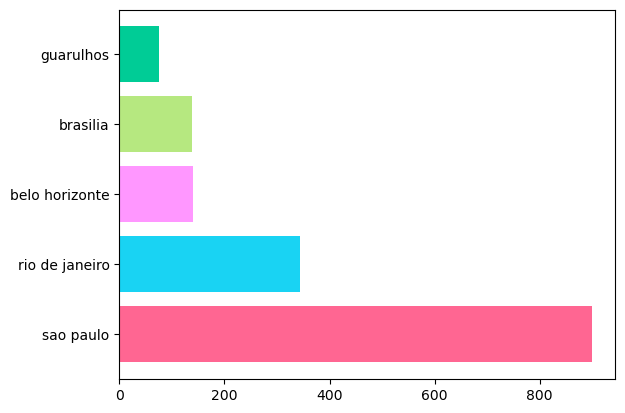

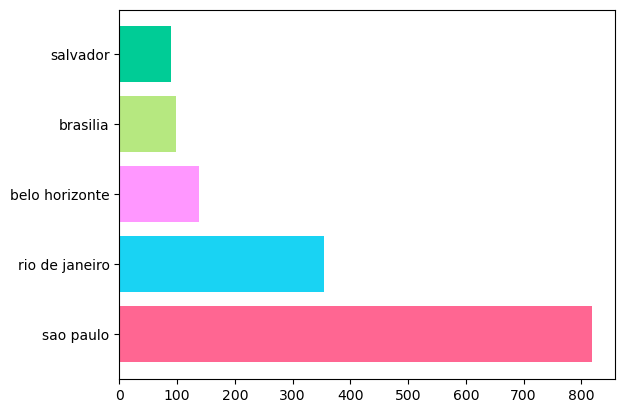

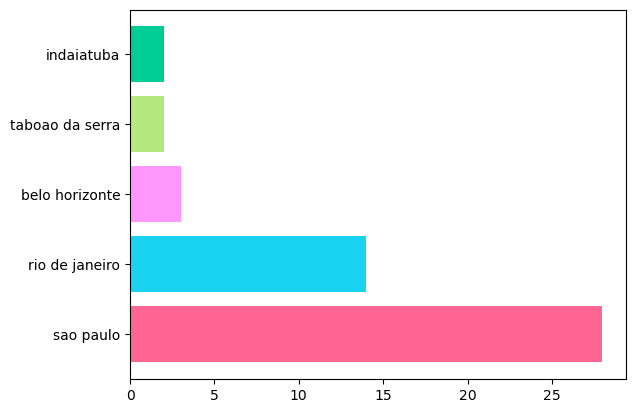

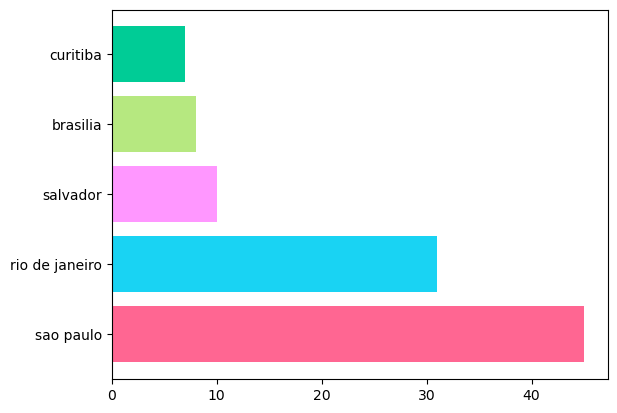

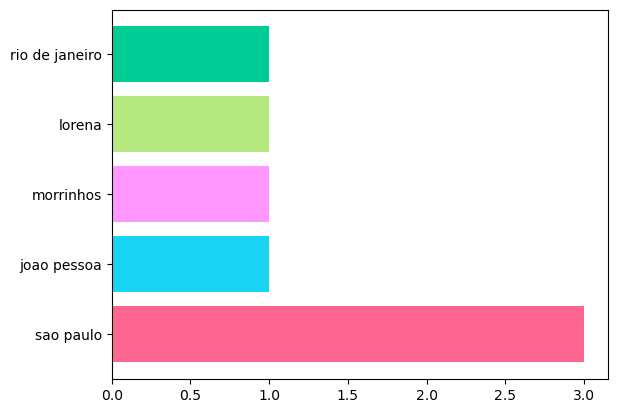

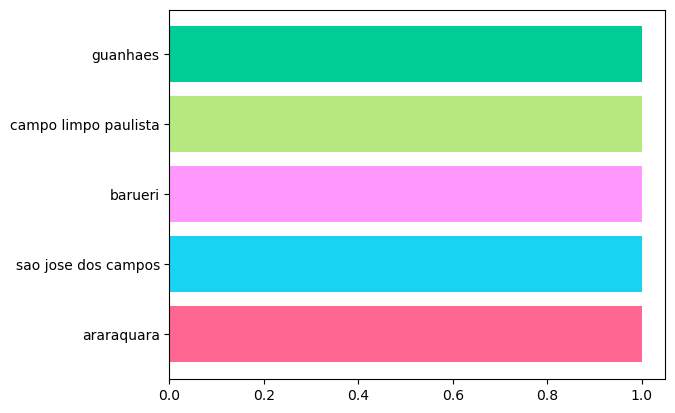

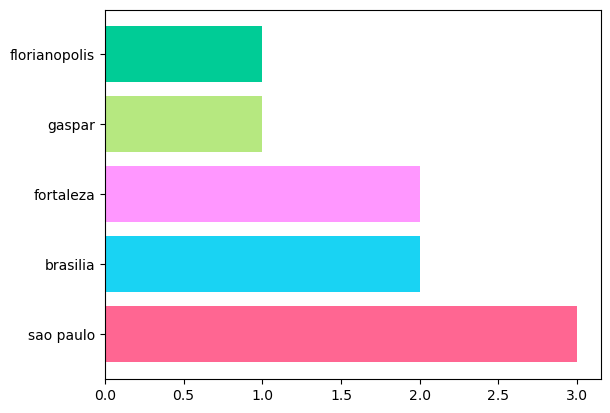

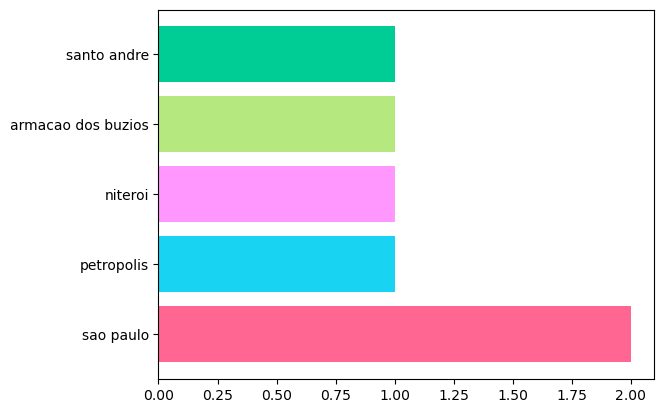

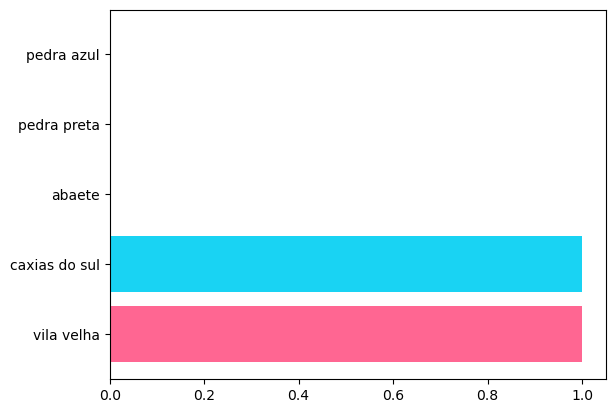

In [87]:
for x in range(0,9):
    df_grouped_cluster0=df_grouped_city[df_grouped_city['cluster']==x]
    df_grouped_cluster0=df_grouped_cluster0.sort_values('counts', ascending = False)
    #the top 5
    df_top5 = df_grouped_cluster0[:5].copy()
    df_top5
    fig, ax = plt.subplots()
    ax.barh(data=df_top5, y=df_top5.customer_city, width=df_top5.counts, color=list(color_map.values()))
    ax.tick_params(axis='both', which='major', labelsize=10)
    fig.show()


### Payment type

The same aggregation function of costumer city part is useful to analyze payments methods. As before, we applied the aggregation function and we grouped by cluster and categorical variable (i.e., payment type).

In [88]:
df_grouped_payment = df_merged_rfm.groupby('customer_unique_id').agg(agg_functions2).reset_index()
df_grouped_payment = df_grouped_payment.groupby(['cluster', 'payment_type']).count()['customer_city'].reset_index(name='counts')
df_grouped_payment

,cluster,payment_type,counts
0,0,boleto,1002
1,0,credit_card,3976
2,0,debit_card,223
3,0,voucher,117
4,1,boleto,963
5,1,credit_card,4123
6,1,debit_card,78
7,1,voucher,122
8,2,boleto,24
9,2,credit_card,87


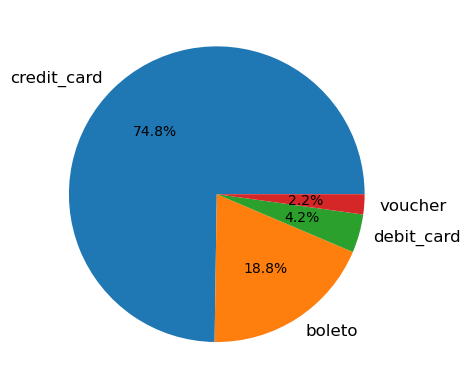

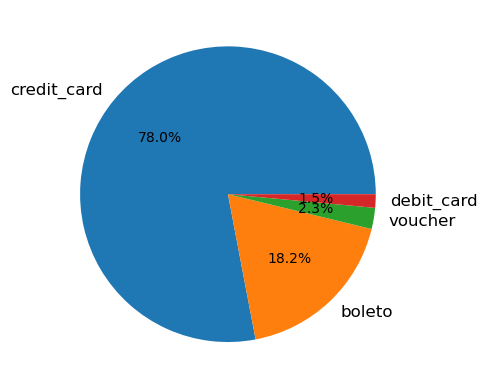

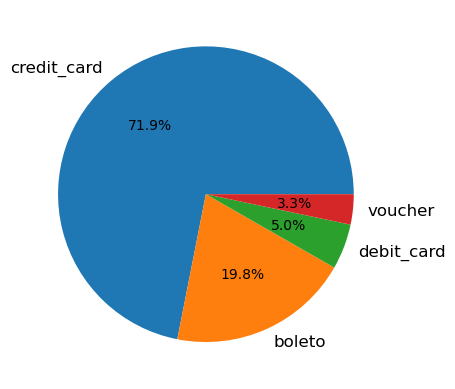

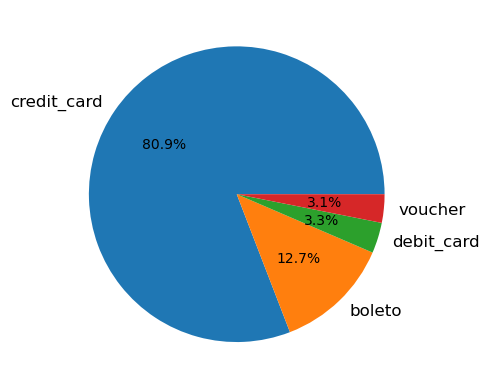

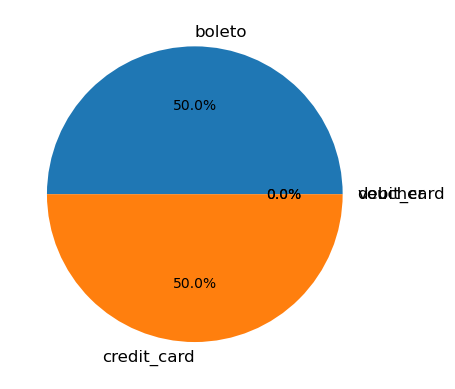

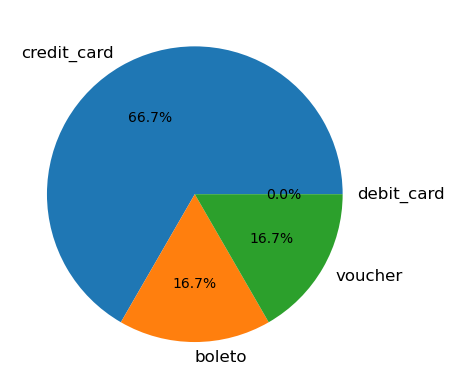

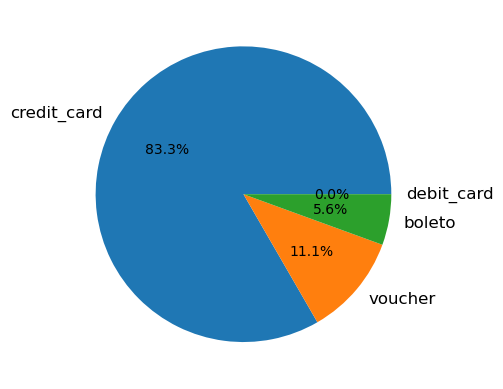

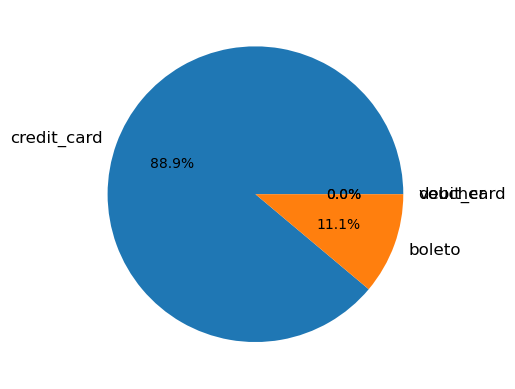

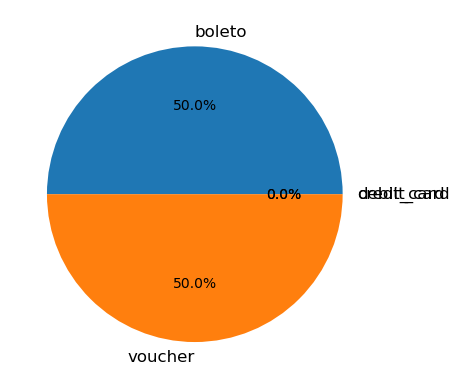

In [89]:
for x in range(0,9):
    df_grouped_cluster0=df_grouped_payment[df_grouped_payment['cluster']==x]
    df_grouped_cluster0=df_grouped_cluster0.sort_values('counts', ascending = False)

    fig, ax = plt.subplots()
    ax.pie(df_grouped_cluster0.counts, labels=df_grouped_cluster0.payment_type,autopct='%1.1f%%')
    fig.show()

###  Average item Acquired per cluster

In order to calculate the number of average item per costumer for each cluster, we divided the number of item per cluster to the number of cluster members. To do that, we create two lists, one with items and one with customers. Then in a for loop we divided the two values and appended the result in a list.

In [90]:
item=list(df_merged_rfm['cluster'].value_counts())
customers=list(df_final_clusters['cluster'].value_counts())
avg_item=[]
for x in range (0,9):
    avg=round(item[x]/customers[x],2)
    avg_item.append(avg)
    
avg_item

[1.2, 1.17, 1.48, 2.49, 2.67, 4.67, 3.38, 1.67, 3.5]

### Average product price by category

In order to evaluate how much costs on average a product for each category, we grouped the original dataframe with respect to category, evaluate the mean and then sort values in ascending order.

In [91]:
df_avg_price_category=df.groupby('product_category_name_english')['price'].mean()
df_avg_price_category=df_avg_price_category.sort_values(ascending=False)

We plot it in an horizontal barchart

In [92]:
b=px.bar(y=df_avg_price_category.index, x=df_avg_price_category.values)
b.update_layout(
    autosize=False,
    width=900,
    height=800,
    )